# Preprocessing
This notebook contains all the necessary steps to preprocess the data and fine-tune the hyperparameters of the model by running an **Optuna** study that iterates over different classifiers and hyperpameter settings.

## Data source

Data are located under the directory `data` and taken from the following paper:
<ul>
<b>Deciphering the determinants of recombinant protein yield across the human secretome</b>
Helen O. Masson, Chih-Chung Kuo, Magdalena Malm, Magnus Lundqvist, Åsa Sievertsson, Anna Berling, Hanna Tegel, Sophia Hober,  Mathias Uhlén, Luigi Grassi, Diane Hatton, Johan Rockberg, Nathan E. Lewis

doi: https://doi.org/10.1101/2022.12.12.520152
</ul>

Data are from the paper's [supplemental section](https://www.biorxiv.org/content/10.1101/2022.12.12.520152v1.supplementary-material)

More specifically, two files are analyzed from `data` which are sourced from:
 - `data/media-4.xlsx` -> [Supplementary Data 2](https://www.biorxiv.org/content/biorxiv/early/2022/12/14/2022.12.12.520152/DC4/embed/media-4.xlsx?download=true)
 - `data/media-12.xlsx` -> [Supplementary Data 10](https://www.biorxiv.org/content/biorxiv/early/2022/12/14/2022.12.12.520152/DC12/embed/media-12.xlsx?download=true)

### Import Libraries and Define Functions

In [3]:
import json
import pandas as pd
import numpy as np
import missingno as msno

from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# ML
import optuna
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Neural Network Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Plot
import seaborn as sns
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'optuna'

In [ ]:
# Functions

def show_heatmap(df, predictor_list, target = 'Status', figsize = (20,10), title='Correlation Heatmap'):
    # create a correlation matrix but specify numeric_only=True to only include columns with numeric data
    correlation_matrix = df[predictor_list + [target]].corr(method='pearson', min_periods=1)
    # create a mask for the upper triangle
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    # set up the matplotlib figure
    plt.figure(figsize=figsize)
    # add a title
    plt.title(title)
    # plot the heatmap
    sns.heatmap(correlation_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0, linewidths=0.5)
    plt.show()

def standardize_values(X):
    from sklearn.preprocessing import StandardScaler
    # create a standard scaler object
    scaler = StandardScaler()
    # fit the scaler to the data
    scaler.fit(X)
    # transform the data
    X_stand = scaler.transform(X)
    return X_stand

def t_sne_plot(X, y, title='t-SNE plot'):
    import matplotlib.pyplot as plt
    from sklearn.manifold import TSNE
    # create a t-SNE object
    tsne = TSNE(n_components=2, random_state=0)
    # fit the t-SNE object to the data
    X_tsne = tsne.fit_transform(X)
    # create a scatter plot of the t-SNE data
    plt.figure(figsize=(10,10))
    plt.scatter(X_tsne[y==0, 0], X_tsne[y==0, 1], label='Fail', c='red', alpha=0.5)
    plt.scatter(X_tsne[y==1, 0], X_tsne[y==1, 1], label='Pass', c='blue', alpha=0.5)
    plt.title(title)
    plt.legend()
    plt.show()

### Load data

In [15]:
# read in the sheet called 'all features' from the raw/media-4.xlsx excel file

df = pd.read_excel('data/media-4.xlsx', sheet_name='all features')
target_df = pd.read_excel('data/media-12.xlsx')

# drop unnecessary columns
df = df.drop(columns=['sample_ID','uniprot_id'])
target_df = target_df[['Gene.name', 'Status']]

# Rename column in the target for merging
target_df = target_df.rename(columns={'Gene.name':'human_symbol'})

# Set Index
df.set_index('human_symbol', inplace=True)
target_df.set_index('human_symbol', inplace=True)

# Group by index and calculate the mean for each group (this will erase duplicate genes)
df = df.groupby(df.index).mean()

In [16]:
target_df

,Status
human_symbol,
A1BG,Pass
A2M,Pass
A2ML1,Fail degradation
AADACL2,Fail secretion
ABHD15,Fail secretion
...,...
ZG16,Pass
ZG16B,Pass
ZNF511-PRAP1,Pass


### Pre-processing

<Axes: >

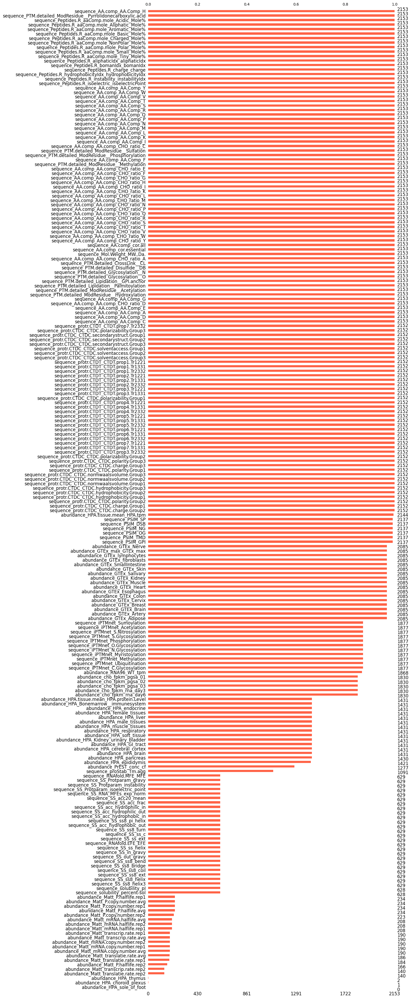

In [4]:
# Missing values
msno.bar(df,figsize=(12, 48), sort="ascending",fontsize=12, color='tomato')

In [5]:
# Drop columns with more than 50% of missing values

# Define the threshold
threshold = 0.5

# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().mean()

# Drop columns exceeding the threshold
columns_to_drop = missing_percentage[missing_percentage > threshold].index
df_dropped = df.drop(columns=columns_to_drop)

In [6]:
# Use KNN inputer to inpute the rest of the missing values

# Save the original index
original_index = df_dropped.index

imputer = KNNImputer(n_neighbors=5)
df_imputed_array = imputer.fit_transform(df_dropped)

df_imputed = pd.DataFrame(df_imputed_array, columns=df_dropped.columns, index=original_index)

In [7]:
# Replace 'Pass' with 1 and anything else with 0 in the target_df

target_df.loc[:,'Status'] = target_df['Status'].replace({'Pass':1})
# if 'Status' != 1, replace with 0
target_df.loc[(target_df['Status']!=1),'Status'] = 0
# display unique classes in 'Status' column
display(target_df['Status'].groupby(target_df['Status']).count())
target_df.head()

Status
0     895
1    1270
Name: Status, dtype: int64

,Status
human_symbol,
A1BG,1
A2M,1
A2ML1,0
AADACL2,0
ABHD15,0


In [8]:
# subsample tartet_df['Status'] == 1 to 895
pass_df = target_df[target_df['Status'] == 1].sample(n=895, random_state=1)
fail_df = target_df[target_df['Status'] == 0]

# combine pass_df and fail_df
new_target_df = pd.concat([pass_df, fail_df])

print(new_target_df['Status'].groupby(new_target_df['Status']).count())
new_target_df.head()

Status
0    895
1    895
Name: Status, dtype: int64


,Status
human_symbol,
PRL,1
CD55,1
IFNA7,1
DEFB116,1
RBP3,1


In [9]:
# Combine features df with Targets df

df_merged = df_imputed.join(new_target_df, how='inner')
print(df_merged.shape)

(1760, 171)


### Explore balance and variability 

In [10]:
# find any columns with zero variability
zero_var_cols = df_merged.columns[df_merged.nunique() == 1]
print(zero_var_cols)

Index([], dtype='object')


Dropping highly correlated columns can be a useful step in a machine learning pipeline to reduce multicollinearity and simplify the model, especially if you're using algorithms that assume feature independence or can be sensitive to multicollinearity, such as linear regression or logistic regression.

In [11]:
# Define correlation threshold
correlation_threshold = 0.80

# Create correlation matrix (numeric_only=True to only include numeric data)
correlation_matrix = df_merged.corr(method='pearson')

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find index of feature columns with correlation greater than correlation_threshold
to_drop = [column for column in upper.columns if any(abs(upper[column]) > correlation_threshold)]

# Print columns to drop and their highly correlated counterparts
for column in to_drop:
    print(f"Column {column} is highly correlated with {list(upper.index[upper[column] > correlation_threshold])}")

print()
print(f'{len(to_drop)} columns to drop: {to_drop}')

Column abundance_GTEx_Breast is highly correlated with ['abundance_GTEx_Adipose']
Column abundance_GTEx_max_GTEx_max is highly correlated with ['abundance_GTEx_Salivary']
Column abundance_HPA.tissue.mean_HPA.protein.Level is highly correlated with ['abundance_HPA_Kidney_urinary_bladder', 'abundance_HPA_endocrine', 'abundance_HPA_liver', 'abundance_HPA_respiratory']
Column abundance_cho_fpkm_pgsa_01 is highly correlated with ['abundance_RNA96_WT_tpm']
Column abundance_cho_fpkm_pgsa_02 is highly correlated with ['abundance_RNA96_WT_tpm', 'abundance_cho_fpkm_pgsa_01']
Column abundance_cho_fpkm_pgsa_03 is highly correlated with ['abundance_RNA96_WT_tpm', 'abundance_cho_fpkm_pgsa_01', 'abundance_cho_fpkm_pgsa_02']
Column sequence_AA.comp_AA.comp_CHO_ratio_A is highly correlated with ['sequence_AA.comp_AA.Comp_A']
Column sequence_AA.comp_AA.comp_CHO_ratio_C is highly correlated with ['sequence_AA.comp_AA.Comp_C']
Column sequence_AA.comp_AA.comp_CHO_ratio_D is highly correlated with ['sequenc

Next we create a list of predictor columns (features) that will be used in a machine learning model, while excluding certain columns that are not useful as predictors or have been identified to be removed due to high correlation.

In [12]:
predictor_list = list(df_merged.columns)
predictor_list.remove('Status')

#remove the columns to drop
predictor_list = [x for x in predictor_list if x not in to_drop]
print(len(predictor_list))

# Save to a JSON file
with open('preprocessed/predictor_list.json', 'w') as f:
    json.dump(predictor_list, f)

117


Nothing Appears to be strongly correlated with the target (Status) **See the bottom of the plot**

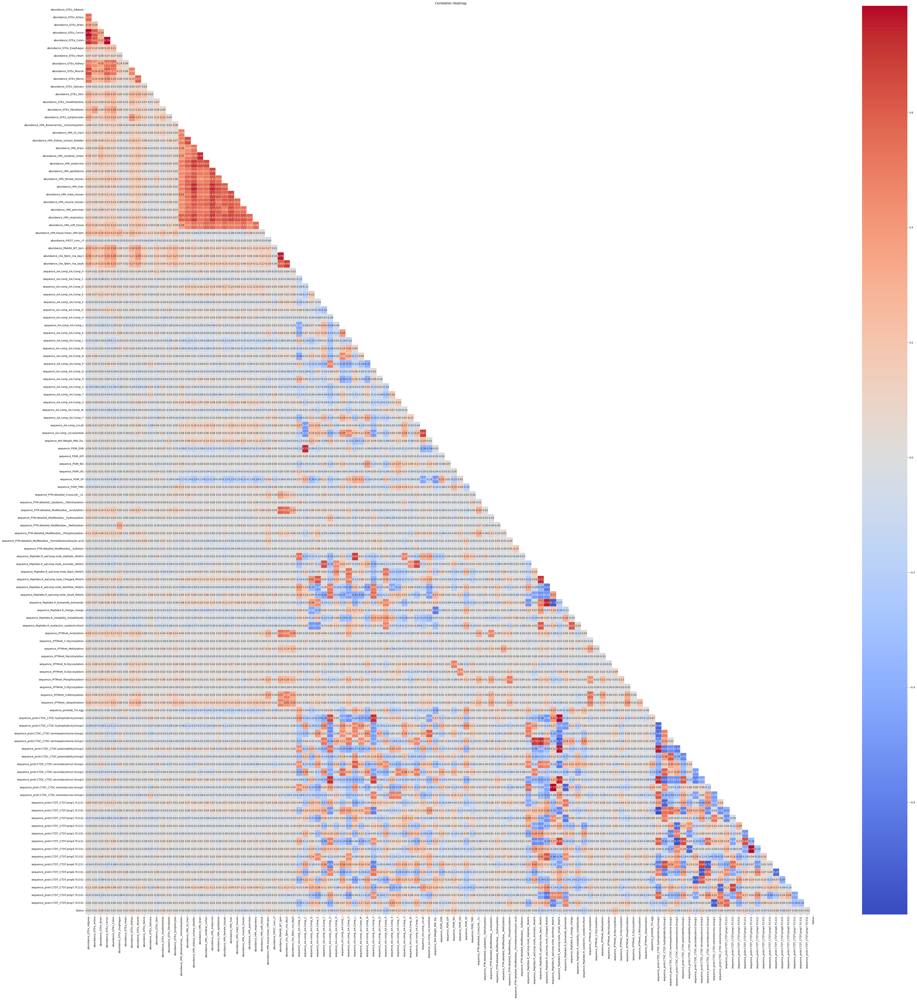

In [13]:
show_heatmap(df=df_merged, target='Status', predictor_list=predictor_list, title='Correlation Heatmap', figsize=(65,65))

### Explore effect of standardization

Seems to have no effect on correlation, good

In [14]:
X_stand  = standardize_values(df_merged[predictor_list].values)

# convert X_stand to a dataframe with columns = df.columns
X_stand_df = pd.DataFrame(X_stand, columns=predictor_list)
# set index of X_stand_df to be the same as new_df
X_stand_df.index = df_merged.index
# add 'Status' to X_stand_df
X_stand_df['Status'] = df_merged['Status']
X_stand_df.describe()

,abundance_GTEx_Adipose,abundance_GTEx_Artery,abundance_GTEx_Brain,abundance_GTEx_Cervix,abundance_GTEx_Colon,abundance_GTEx_Esophagus,abundance_GTEx_Heart,abundance_GTEx_Kidney,abundance_GTEx_Muscle,abundance_GTEx_Nerve,...,sequence_protr.CTDT_CTDT.prop2.Tr1331,sequence_protr.CTDT_CTDT.prop4.Tr1221,sequence_protr.CTDT_CTDT.prop4.Tr1331,sequence_protr.CTDT_CTDT.prop5.Tr1331,sequence_protr.CTDT_CTDT.prop6.Tr1221,sequence_protr.CTDT_CTDT.prop6.Tr1331,sequence_protr.CTDT_CTDT.prop6.Tr2332,sequence_protr.CTDT_CTDT.prop7.Tr1221,sequence_protr.CTDT_CTDT.prop7.Tr1331,sequence_protr.CTDT_CTDT.prop7.Tr2332
count,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,...,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03,1.760000e+03
mean,3.229740e-17,-3.330669e-17,-4.239033e-17,2.018587e-17,3.835316e-17,2.018587e-18,-2.018587e-18,2.422305e-17,-6.812732e-18,-1.614870e-17,...,-7.468773e-16,4.743680e-16,-6.661338e-17,-3.159089e-16,7.004498e-16,-6.055762e-17,3.471970e-16,-4.107825e-16,-1.826822e-16,-3.027881e-16
std,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,...,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00,1.000284e+00
min,-2.903032e-01,-1.963241e-01,-2.219522e-01,-2.789762e-01,-3.081502e-01,-1.085398e-01,-5.531784e-02,-2.693486e-01,-2.411352e-01,-1.344659e-01,...,-4.487691e+00,-4.732727e+00,-3.726355e+00,-1.845995e+00,-4.886270e+00,-3.771528e+00,-4.133979e+00,-4.850014e+00,-4.527477e+00,-3.493309e+00
25%,-2.894373e-01,-1.960139e-01,-2.200493e-01,-2.779196e-01,-3.059688e-01,-1.080799e-01,-5.522505e-02,-2.675388e-01,-2.405787e-01,-1.340873e-01,...,-6.459321e-01,-5.721827e-01,-6.273027e-01,-6.219414e-01,-4.579401e-01,-5.914177e-01,-5.636875e-01,-5.551833e-01,-5.820015e-01,-6.201760e-01
50%,-2.760525e-01,-1.908384e-01,-2.012410e-01,-2.635325e-01,-2.806883e-01,-1.028644e-01,-5.375671e-02,-2.504279e-01,-2.302081e-01,-1.282597e-01,...,-5.607877e-02,-2.797841e-02,-2.287428e-02,-1.258852e-01,6.686760e-02,-9.504155e-02,3.523781e-02,7.438022e-02,-8.492011e-03,-1.658445e-02
75%,-1.626351e-01,-1.351131e-01,-1.083273e-01,-1.433709e-01,-1.182501e-01,-6.221529e-02,-4.079843e-02,-1.272610e-01,-1.294220e-01,-7.454124e-02,...,6.485457e-01,5.541462e-01,5.810953e-01,4.817162e-01,5.557718e-01,4.988551e-01,6.492961e-01,6.169779e-01,5.372122e-01,6.151731e-01
max,1.418888e+01,2.629877e+01,1.843522e+01,1.615121e+01,1.644791e+01,3.788031e+01,4.155078e+01,1.768701e+01,1.943456e+01,3.565804e+01,...,3.642690e+00,4.494137e+00,4.614527e+00,7.248840e+00,4.831343e+00,6.870092e+00,4.737960e+00,4.132615e+00,6.452190e+00,1.070147e+01


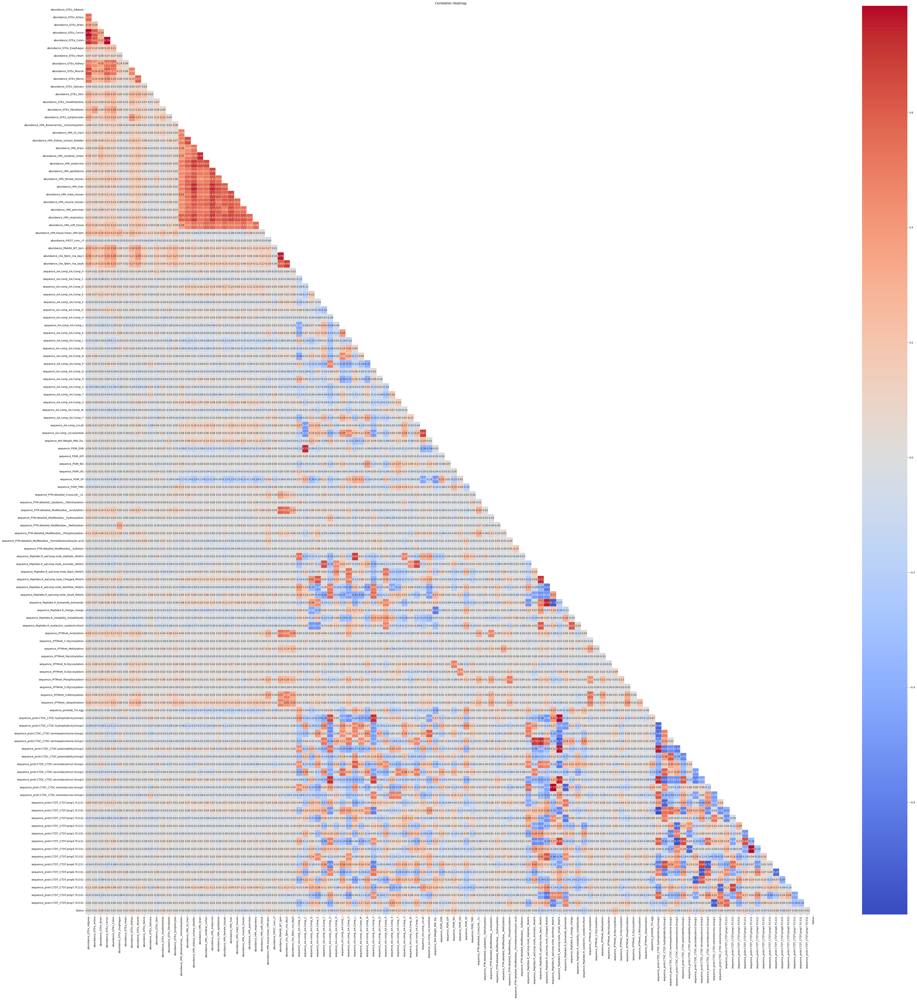

In [15]:
show_heatmap(df=X_stand_df, target='Status', predictor_list=predictor_list, title='Correlation Heatmap', figsize=(65,65))

### Look at t-SNE, is there any structure at all?
If not, maybe this won't work.

Hmm. This really looks like noise, but lets see

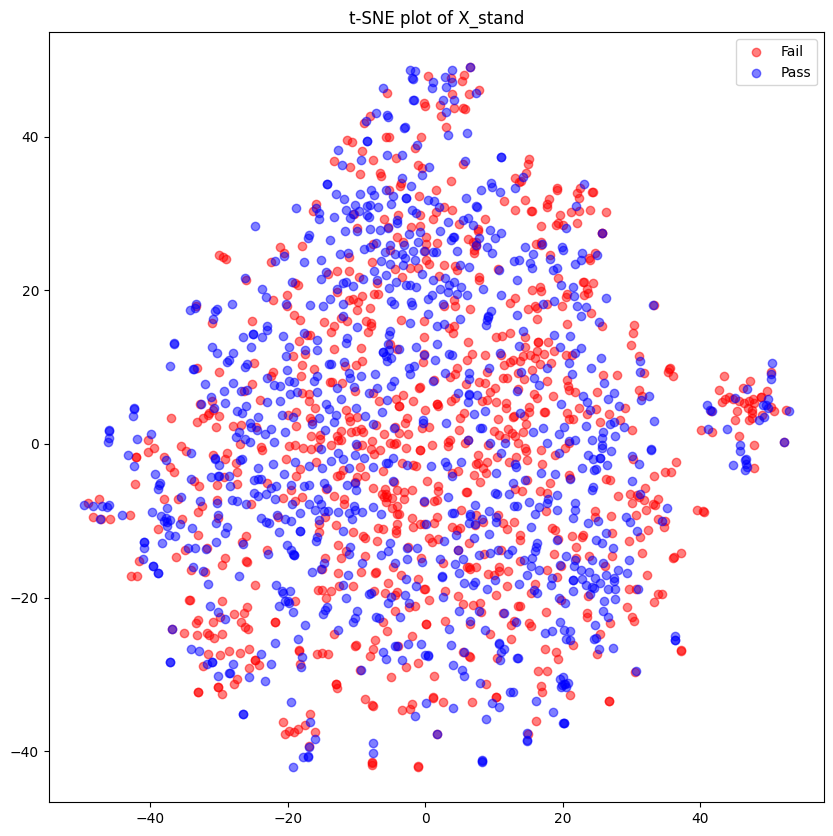

In [16]:
# create a t-sne plot of the data in new_df colored by the 'Status' column
t_sne_plot(X_stand, df_merged['Status'], title='t-SNE plot of X_stand')

### Data splitting strategy

In [17]:
df_merged['Status'].astype(int)
df_merged.shape

(1760, 171)

In [18]:
# Shuffle the rows and split the data into training, validation, calibration, and testing sets

# Step 1: Split the data into training (70%) and temporary (30%) sets
train_df, tmp_df = train_test_split(df_merged, test_size=0.3, random_state=1, stratify=df_merged['Status'])
# train_df: 70% of the data, used for training the model
# tmp_df: 30% of the data, used for further splitting into validation and testing sets

# Step 2: Split the temporary set into validation (20% of the original) and testing (10% of the original) sets
tmp2_df, test_df = train_test_split(tmp_df, test_size=0.33, random_state=1, stratify=tmp_df['Status'])
# tmp2_df: ~20% of the original data, used for further splitting into validation and calibration sets
# test_df: ~10% of the original data, used for final model testing

# Step 3: Split the tmp2_df data into validation (10% of the original) and calibration (10% of the original) sets
val_df, cal_df = train_test_split(tmp2_df, test_size=0.5, random_state=1, stratify=tmp2_df['Status'])
# val_df: ~10% of the original data, used for model validation during training
# cal_df: ~10% of the original data, used for model calibration or hyperparameter tuning

# Display the shapes of the resulting datasets
train_df.shape, val_df.shape, cal_df.shape, test_df.shape

((1232, 171), (176, 171), (177, 171), (175, 171))

In [19]:
# check the distribution of 'Status' in train_df, val_df, cal_df, and test_df
display(train_df['Status'].groupby(train_df['Status']).count())
display(val_df['Status'].groupby(val_df['Status']).count())
display(cal_df['Status'].groupby(cal_df['Status']).count())
display(test_df['Status'].groupby(test_df['Status']).count())


Status
0    613
1    619
Name: Status, dtype: int64

Status
0    88
1    88
Name: Status, dtype: int64

Status
0    88
1    89
Name: Status, dtype: int64

Status
0    87
1    88
Name: Status, dtype: int64

In [20]:
# Save datasets in the "preprocessed" folder
train_df.to_csv('preprocessed/train.csv', index=False)
val_df.to_csv('preprocessed/val.csv', index=False)
cal_df.to_csv('preprocessed/cal.csv', index=False)
test_df.to_csv('preprocessed/test.csv', index=False)

## Optuna Study

In [30]:


def get_data():
    y = train_df['Status'].values.astype(int)  # Ensure the target values are integers
    X = train_df[predictor_list].values
    return X, y

# Objective function for Optuna
def objective(trial: optuna.Trial) -> float:
    X, y = get_data()
    train_x, valid_x, train_y, valid_y = train_test_split(X, y, test_size=0.25, stratify=y)
    
    # Suggest classifier
    classifier_name = trial.suggest_categorical("classifier", ["XGBoost", "RandomForest", "LogisticRegression", "NeuralNetwork"])
        
    if classifier_name == "XGBoost":
        param = {
            "objective": "binary:logistic",
            "colsample_bytree": trial.suggest_float("xgb_colsample_bytree", 0.5, 1.0),
            "learning_rate": trial.suggest_float("xgb_learning_rate", 0.01, 0.1),
            "max_depth": trial.suggest_int("xgb_max_depth", 1, 12),
            "n_estimators": trial.suggest_int("xgb_n_estimators", 100, 1000),
            "subsample": trial.suggest_float("xgb_subsample", 0.5, 1.0),
            "early_stopping_rounds": 100,
        }
        gbm = xgb.XGBClassifier(**param)
        gbm.fit(train_x, train_y, eval_set=[(valid_x, valid_y)], verbose=False)
        preds = gbm.predict(valid_x)
        
    elif classifier_name == "RandomForest":
        param = {
            "n_estimators": trial.suggest_int("rf_n_estimators", 100, 1000),
            "max_depth": trial.suggest_int("rf_max_depth", 1, 12),
            "min_samples_split": trial.suggest_int("rf_min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("rf_min_samples_leaf", 1, 10),
            "bootstrap": trial.suggest_categorical("rf_bootstrap", [True, False]),
        }
        gbm = RandomForestClassifier(**param)
        gbm.fit(train_x, train_y)
        preds = gbm.predict(valid_x)
        
    elif classifier_name == "LogisticRegression":
        param = {
            "C": trial.suggest_float("lr_C", 1e-6, 1e2, log=True),
            "max_iter": trial.suggest_int("lr_max_iter", 100, 1000),
            "solver": trial.suggest_categorical("lr_solver", ["lbfgs", "liblinear", "sag", "saga"]),
        }
        gbm = LogisticRegression(**param)
        gbm.fit(train_x, train_y)
        preds = gbm.predict(valid_x)

    elif classifier_name == "NeuralNetwork":
        # Define hyperparameters
        n_layers = trial.suggest_int("nn_n_layers", 2, 4)
        dropout_rate = trial.suggest_float("nn_dropout_rate", 0.3, 0.5)
        layer_size = trial.suggest_int("nn_layer_size", 64, 256)
        learning_rate = trial.suggest_float("nn_learning_rate", 1e-5, 1e-3, log=True)
        
        # Build neural network
        model = Sequential()
        model.add(Dense(layer_size, activation="relu", input_shape=(train_x.shape[1],)))
        
        for _ in range(n_layers):
            model.add(Dense(layer_size, activation="relu"))
            model.add(Dropout(dropout_rate))
            layer_size = max(layer_size // 2, 32)  # Decrease layer size progressively
            
        model.add(Dense(1, activation="sigmoid"))
        
        # Compile model
        model.compile(optimizer=Adam(learning_rate=learning_rate), loss="binary_crossentropy", metrics=["accuracy"])
        
        # Train model
        model.fit(train_x, train_y, epochs=trial.suggest_int("nn_epochs", 50, 200), batch_size=trial.suggest_int("nn_batch_size", 32, 256), verbose=0, validation_data=(valid_x, valid_y))
        preds = (model.predict(valid_x) > 0.5).astype(int).flatten()


    pred_labels = np.rint(preds).astype(int) # Ensure binary format (0 or 1)
    valid_y = valid_y.astype(int)
    accuracy = accuracy_score(valid_y, pred_labels)
    return accuracy

In [31]:
# Optuna Study

import warnings
warnings.filterwarnings("ignore")

study = optuna.create_study(
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=5), direction="maximize"
)
study.optimize(objective, n_trials=500, timeout=3600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

# Save the best parameters to a JSON file
best_params = trial.params
with open("best_params.json", "w") as f:
    json.dump(best_params, f, indent=4)

print("Best parameters saved to best_params.json")

[I 2024-08-23 11:28:00,829] A new study created in memory with name: no-name-a7c8a489-dc27-4539-b64a-dbfd501da5e4
[I 2024-08-23 11:28:01,546] Trial 0 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.924362325598375, 'xgb_learning_rate': 0.07771052904050972, 'xgb_max_depth': 3, 'xgb_n_estimators': 925, 'xgb_subsample': 0.8150649551385767}. Best is trial 0 with value: 0.6948051948051948.


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:28:08,674] Trial 1 finished with value: 0.5064935064935064 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.4441769154696267, 'nn_layer_size': 154, 'nn_learning_rate': 5.2421300580339466e-05, 'nn_epochs': 171, 'nn_batch_size': 175}. Best is trial 0 with value: 0.6948051948051948.
[I 2024-08-23 11:28:09,836] Trial 2 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.6125263003563086, 'xgb_learning_rate': 0.04372665352669038, 'xgb_max_depth': 12, 'xgb_n_estimators': 252, 'xgb_subsample': 0.9036085837642386}. Best is trial 0 with value: 0.6948051948051948.
[I 2024-08-23 11:28:10,182] Trial 3 finished with value: 0.5974025974025974 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 0.00011079993457710796, 'lr_max_iter': 797, 'lr_solver': 'lbfgs'}. Best is trial 0 with value: 0.6948051948051948.


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:28:16,484] Trial 4 finished with value: 0.5064935064935064 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.3646320605425119, 'nn_layer_size': 240, 'nn_learning_rate': 0.00033033482279988064, 'nn_epochs': 128, 'nn_batch_size': 189}. Best is trial 0 with value: 0.6948051948051948.
[I 2024-08-23 11:28:16,730] Trial 5 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8364018896940059, 'xgb_learning_rate': 0.05552790755799178, 'xgb_max_depth': 2, 'xgb_n_estimators': 179, 'xgb_subsample': 0.6747255389071656}. Best is trial 5 with value: 0.7077922077922078.
[I 2024-08-23 11:28:17,212] Trial 6 finished with value: 0.5 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 0.0009003484892157412, 'lr_max_iter': 447, 'lr_solver': 'saga'}. Best is trial 5 with value: 0.7077922077922078.
[I 2024-08-23 11:28:18,656] Trial 7 finished with value: 0.6915584415584416 and parameters: {'

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:28:25,015] Trial 8 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.32793860671264646, 'nn_layer_size': 177, 'nn_learning_rate': 5.653908697202846e-05, 'nn_epochs': 94, 'nn_batch_size': 47}. Best is trial 5 with value: 0.7077922077922078.
[I 2024-08-23 11:28:25,821] Trial 9 finished with value: 0.711038961038961 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7716495633652739, 'xgb_learning_rate': 0.08608644694681239, 'xgb_max_depth': 8, 'xgb_n_estimators': 322, 'xgb_subsample': 0.7155246452518362}. Best is trial 9 with value: 0.711038961038961.
[I 2024-08-23 11:28:26,925] Trial 10 finished with value: 0.7012987012987013 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 157, 'rf_max_depth': 12, 'rf_min_samples_split': 8, 'rf_min_samples_leaf': 6, 'rf_bootstrap': False}. Best is trial 9 with value: 0.711038961038961.
[I 2024-08-23 11:28:27,014] Trial 11 fini

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:28:46,470] Trial 27 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.49374475871516654, 'nn_layer_size': 71, 'nn_learning_rate': 1.0609947460058585e-05, 'nn_epochs': 50, 'nn_batch_size': 253}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:28:47,108] Trial 28 finished with value: 0.5097402597402597 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 12.332862815863512, 'lr_max_iter': 880, 'lr_solver': 'sag'}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:28:47,707] Trial 29 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.622406911392412, 'xgb_learning_rate': 0.051427696524088434, 'xgb_max_depth': 4, 'xgb_n_estimators': 325, 'xgb_subsample': 0.6080007445651647}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:28:48,698] Trial 30 finished with value: 0.6363636363636364 a

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:28:59,520] Trial 35 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.407203989924297, 'nn_layer_size': 67, 'nn_learning_rate': 0.0009708910518353761, 'nn_epochs': 196, 'nn_batch_size': 33}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:29:00,326] Trial 36 finished with value: 0.7207792207792207 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8194630689829752, 'xgb_learning_rate': 0.04875035943027502, 'xgb_max_depth': 6, 'xgb_n_estimators': 785, 'xgb_subsample': 0.5156244750981571}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:29:00,512] Trial 37 finished with value: 0.4935064935064935 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 1.2483525874909882e-06, 'lr_max_iter': 115, 'lr_solver': 'sag'}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:29:02,319] Trial 38 finished with value: 0.6493506493506493 

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:29:09,801] Trial 39 finished with value: 0.4902597402597403 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.3024124376744364, 'nn_layer_size': 252, 'nn_learning_rate': 1.0018264608833066e-05, 'nn_epochs': 137, 'nn_batch_size': 105}. Best is trial 19 with value: 0.7207792207792207.
[I 2024-08-23 11:29:10,825] Trial 40 finished with value: 0.7272727272727273 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5372757688032481, 'xgb_learning_rate': 0.04085485173773682, 'xgb_max_depth': 12, 'xgb_n_estimators': 718, 'xgb_subsample': 0.7301420111108713}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:29:11,927] Trial 41 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5020793385582714, 'xgb_learning_rate': 0.045622703605429596, 'xgb_max_depth': 12, 'xgb_n_estimators': 838, 'xgb_subsample': 0.7467117480362283}. Best is trial 40 with value: 0.7272

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:29:22,409] Trial 50 finished with value: 0.4967532467532468 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.4996904718376007, 'nn_layer_size': 136, 'nn_learning_rate': 0.0002039879319146779, 'nn_epochs': 57, 'nn_batch_size': 252}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:29:23,105] Trial 51 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.808928129496838, 'xgb_learning_rate': 0.05115759658382892, 'xgb_max_depth': 5, 'xgb_n_estimators': 642, 'xgb_subsample': 0.5637470165555223}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:29:23,517] Trial 52 finished with value: 0.6818181818181818 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.835057764501649, 'xgb_learning_rate': 0.06710963640000026, 'xgb_max_depth': 4, 'xgb_n_estimators': 508, 'xgb_subsample': 0.6057281952884012}. Best is trial 40 with value: 0.72727272727

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:30:14,658] Trial 81 finished with value: 0.4967532467532468 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.4331315719268368, 'nn_layer_size': 204, 'nn_learning_rate': 2.7809250890523486e-05, 'nn_epochs': 90, 'nn_batch_size': 107}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:30:15,731] Trial 82 finished with value: 0.6948051948051948 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 267, 'rf_max_depth': 8, 'rf_min_samples_split': 7, 'rf_min_samples_leaf': 4, 'rf_bootstrap': True}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:30:16,277] Trial 83 finished with value: 0.4967532467532468 and parameters: {'classifier': 'LogisticRegression', 'lr_C': 1.4571795774975308e-06, 'lr_max_iter': 689, 'lr_solver': 'saga'}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:30:19,763] Trial 84 finished with value: 0.6396103896103896 and parameters: {'classifier': 'RandomFor

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:30:36,126] Trial 88 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.36858275464614915, 'nn_layer_size': 115, 'nn_learning_rate': 0.0008945745714548725, 'nn_epochs': 159, 'nn_batch_size': 111}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:30:39,159] Trial 89 finished with value: 0.6818181818181818 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5350822591880332, 'xgb_learning_rate': 0.02065618196487435, 'xgb_max_depth': 12, 'xgb_n_estimators': 391, 'xgb_subsample': 0.7474092949576439}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:30:41,418] Trial 90 finished with value: 0.6883116883116883 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 468, 'rf_max_depth': 11, 'rf_min_samples_split': 5, 'rf_min_samples_leaf': 2, 'rf_bootstrap': True}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:30:42,316] Tri

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:31:08,303] Trial 108 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.4633473348710879, 'nn_layer_size': 106, 'nn_learning_rate': 0.0001723865291883434, 'nn_epochs': 94, 'nn_batch_size': 206}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:31:10,965] Trial 109 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7802992979372688, 'xgb_learning_rate': 0.011377674126817706, 'xgb_max_depth': 11, 'xgb_n_estimators': 197, 'xgb_subsample': 0.6703131162949636}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:31:14,287] Trial 110 finished with value: 0.698051948051948 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 669, 'rf_max_depth': 11, 'rf_min_samples_split': 10, 'rf_min_samples_leaf': 6, 'rf_bootstrap': True}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:31:15,085] Tr

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:31:46,239] Trial 130 finished with value: 0.4967532467532468 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.37668391773192955, 'nn_layer_size': 210, 'nn_learning_rate': 0.0004022944076741586, 'nn_epochs': 194, 'nn_batch_size': 71}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:31:47,674] Trial 131 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7730479248848143, 'xgb_learning_rate': 0.02614296014990496, 'xgb_max_depth': 9, 'xgb_n_estimators': 174, 'xgb_subsample': 0.853539067291159}. Best is trial 40 with value: 0.7272727272727273.
[I 2024-08-23 11:31:49,178] Trial 132 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8072217255982311, 'xgb_learning_rate': 0.029030476385608434, 'xgb_max_depth': 7, 'xgb_n_estimators': 200, 'xgb_subsample': 0.8231153178791848}. Best is trial 40 with value: 0.727272

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:32:26,287] Trial 160 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.3340934344781146, 'nn_layer_size': 183, 'nn_learning_rate': 2.159079873769541e-05, 'nn_epochs': 74, 'nn_batch_size': 147}. Best is trial 142 with value: 0.737012987012987.
[I 2024-08-23 11:32:28,423] Trial 161 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7894009858541354, 'xgb_learning_rate': 0.017678460434509925, 'xgb_max_depth': 8, 'xgb_n_estimators': 867, 'xgb_subsample': 0.9974813523450453}. Best is trial 142 with value: 0.737012987012987.
[I 2024-08-23 11:32:29,895] Trial 162 finished with value: 0.7045454545454546 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5801084432799062, 'xgb_learning_rate': 0.03311879376892386, 'xgb_max_depth': 12, 'xgb_n_estimators': 249, 'xgb_subsample': 0.6738104607387738}. Best is trial 142 with value: 0.737

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:33:24,129] Trial 198 finished with value: 0.5 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.40669608449146155, 'nn_layer_size': 105, 'nn_learning_rate': 9.861561294350554e-05, 'nn_epochs': 113, 'nn_batch_size': 225}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:33:25,568] Trial 199 finished with value: 0.7012987012987013 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5209072203793699, 'xgb_learning_rate': 0.025318907649316602, 'xgb_max_depth': 9, 'xgb_n_estimators': 409, 'xgb_subsample': 0.7413958681004109}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:33:27,835] Trial 200 finished with value: 0.6461038961038961 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5371354639034408, 'xgb_learning_rate': 0.014667547710665028, 'xgb_max_depth': 12, 'xgb_n_estimators': 841, 'xgb_subsample': 0.7552179097964441}. Best is trial 184 with value: 0.746753246753

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:34:37,883] Trial 240 finished with value: 0.5 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.30016467176846245, 'nn_layer_size': 224, 'nn_learning_rate': 0.000447975167344576, 'nn_epochs': 155, 'nn_batch_size': 72}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:34:38,736] Trial 241 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7075930974554498, 'xgb_learning_rate': 0.029889172198221133, 'xgb_max_depth': 5, 'xgb_n_estimators': 686, 'xgb_subsample': 0.6826198168097894}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:34:39,832] Trial 242 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8144181201686225, 'xgb_learning_rate': 0.02827404523255231, 'xgb_max_depth': 6, 'xgb_n_estimators': 314, 'xgb_subsample': 0.6685463059537319}. Best is trial 184 with value: 0.7467532467532467

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:35:17,001] Trial 271 finished with value: 0.4967532467532468 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.47322690526710653, 'nn_layer_size': 138, 'nn_learning_rate': 8.072029172136257e-05, 'nn_epochs': 111, 'nn_batch_size': 165}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:35:18,134] Trial 272 finished with value: 0.6915584415584416 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8402365590334919, 'xgb_learning_rate': 0.031710150242556946, 'xgb_max_depth': 8, 'xgb_n_estimators': 398, 'xgb_subsample': 0.5783355147294591}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:35:19,846] Trial 273 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9148090640267901, 'xgb_learning_rate': 0.026606011846653267, 'xgb_max_depth': 11, 'xgb_n_estimators': 752, 'xgb_subsample': 0.689903561071582}. Best is trial 184 with value: 0

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:35:52,663] Trial 295 finished with value: 0.4935064935064935 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.4294731448818136, 'nn_layer_size': 185, 'nn_learning_rate': 2.3534670437663565e-05, 'nn_epochs': 176, 'nn_batch_size': 135}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:35:54,663] Trial 296 finished with value: 0.6785714285714286 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.786721768549195, 'xgb_learning_rate': 0.018929458165772024, 'xgb_max_depth': 11, 'xgb_n_estimators': 469, 'xgb_subsample': 0.6627489177864473}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:35:56,083] Trial 297 finished with value: 0.6915584415584416 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 226, 'rf_max_depth': 9, 'rf_min_samples_split': 7, 'rf_min_samples_leaf': 9, 'rf_bootstrap': False}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:35:56,91

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:36:50,335] Trial 331 finished with value: 0.5 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.3399058900627438, 'nn_layer_size': 91, 'nn_learning_rate': 0.00017862633784040637, 'nn_epochs': 143, 'nn_batch_size': 229}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:36:51,716] Trial 332 finished with value: 0.672077922077922 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7775709514751323, 'xgb_learning_rate': 0.025724728913178632, 'xgb_max_depth': 8, 'xgb_n_estimators': 507, 'xgb_subsample': 0.6507172274216803}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:36:53,373] Trial 333 finished with value: 0.685064935064935 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7378910344113055, 'xgb_learning_rate': 0.03575032369618569, 'xgb_max_depth': 11, 'xgb_n_estimators': 658, 'xgb_subsample': 0.7193505998111517}. Best is trial 184 with value: 0.7467532467532467

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:37:22,682] Trial 353 finished with value: 0.4967532467532468 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.46716769667954317, 'nn_layer_size': 158, 'nn_learning_rate': 4.094110366396229e-05, 'nn_epochs': 68, 'nn_batch_size': 136}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:37:24,512] Trial 354 finished with value: 0.6948051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7638217756604863, 'xgb_learning_rate': 0.023043286457457176, 'xgb_max_depth': 9, 'xgb_n_estimators': 648, 'xgb_subsample': 0.6658269397555299}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:37:26,024] Trial 355 finished with value: 0.6655844155844156 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8060016341537273, 'xgb_learning_rate': 0.03543930429106208, 'xgb_max_depth': 11, 'xgb_n_estimators': 325, 'xgb_subsample': 0.7366718295492717}. Best is trial 184 with value: 0

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:38:02,836] Trial 387 finished with value: 0.512987012987013 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.39072526897541493, 'nn_layer_size': 132, 'nn_learning_rate': 0.0006515256282983947, 'nn_epochs': 107, 'nn_batch_size': 75}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:38:04,339] Trial 388 finished with value: 0.7337662337662337 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7552792903925654, 'xgb_learning_rate': 0.049210049114394264, 'xgb_max_depth': 12, 'xgb_n_estimators': 823, 'xgb_subsample': 0.6731705486737435}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:38:05,728] Trial 389 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.7591907380601134, 'xgb_learning_rate': 0.04915529842462184, 'xgb_max_depth': 12, 'xgb_n_estimators': 887, 'xgb_subsample': 0.6706901722018852}. Best is trial 184 with value: 0

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:38:37,077] Trial 407 finished with value: 0.4805194805194805 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 2, 'nn_dropout_rate': 0.41671426895470903, 'nn_layer_size': 82, 'nn_learning_rate': 0.00026333938281096887, 'nn_epochs': 177, 'nn_batch_size': 200}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:38:37,464] Trial 408 finished with value: 0.698051948051948 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5523570846662789, 'xgb_learning_rate': 0.028064312755929324, 'xgb_max_depth': 5, 'xgb_n_estimators': 122, 'xgb_subsample': 0.5327691639983886}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:38:39,083] Trial 409 finished with value: 0.6558441558441559 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5771801224824452, 'xgb_learning_rate': 0.03190429588239308, 'xgb_max_depth': 10, 'xgb_n_estimators': 354, 'xgb_subsample': 0.6402192148486441}. Best is trial 184 with value: 0

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:39:10,239] Trial 430 finished with value: 0.4967532467532468 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.34902925828002546, 'nn_layer_size': 226, 'nn_learning_rate': 0.00014249291472269186, 'nn_epochs': 75, 'nn_batch_size': 158}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:39:11,879] Trial 431 finished with value: 0.7012987012987013 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5482645740096264, 'xgb_learning_rate': 0.03228377268897485, 'xgb_max_depth': 11, 'xgb_n_estimators': 384, 'xgb_subsample': 0.7004062690095942}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:39:13,146] Trial 432 finished with value: 0.6688311688311688 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.5285922027628287, 'xgb_learning_rate': 0.035220468501444224, 'xgb_max_depth': 11, 'xgb_n_estimators': 417, 'xgb_subsample': 0.7155560738523646}. Best is trial 184 with value:

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-08-23 11:39:46,902] Trial 457 finished with value: 0.5032467532467533 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 3, 'nn_dropout_rate': 0.3918389670148969, 'nn_layer_size': 172, 'nn_learning_rate': 1.3743406710819986e-05, 'nn_epochs': 146, 'nn_batch_size': 228}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:39:48,289] Trial 458 finished with value: 0.7012987012987013 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8888732831089243, 'xgb_learning_rate': 0.02078209654079627, 'xgb_max_depth': 8, 'xgb_n_estimators': 114, 'xgb_subsample': 0.6671113684723291}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:39:49,796] Trial 459 finished with value: 0.7175324675324676 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.9581438000243987, 'xgb_learning_rate': 0.027669986066586473, 'xgb_max_depth': 11, 'xgb_n_estimators': 125, 'xgb_subsample': 0.6993035293953035}. Best is trial 184 with value: 

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2024-08-23 11:40:23,026] Trial 479 finished with value: 0.5064935064935064 and parameters: {'classifier': 'NeuralNetwork', 'nn_n_layers': 4, 'nn_dropout_rate': 0.31661336579413996, 'nn_layer_size': 256, 'nn_learning_rate': 3.53975156793925e-05, 'nn_epochs': 120, 'nn_batch_size': 84}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:40:23,893] Trial 480 finished with value: 0.7077922077922078 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8748444488919965, 'xgb_learning_rate': 0.0250179262565359, 'xgb_max_depth': 6, 'xgb_n_estimators': 701, 'xgb_subsample': 0.6768665269464801}. Best is trial 184 with value: 0.7467532467532467.
[I 2024-08-23 11:40:25,081] Trial 481 finished with value: 0.7045454545454546 and parameters: {'classifier': 'XGBoost', 'xgb_colsample_bytree': 0.8440303026700362, 'xgb_learning_rate': 0.0312558406427109, 'xgb_max_depth': 5, 'xgb_n_estimators': 668, 'xgb_subsample': 0.6650958329143736}. Best is trial 184 with value: 0.7467

Number of finished trials: 500
Best trial:
  Value: 0.7467532467532467
  Params: 
    classifier: XGBoost
    xgb_colsample_bytree: 0.7896000122582489
    xgb_learning_rate: 0.027434724266888824
    xgb_max_depth: 8
    xgb_n_estimators: 211
    xgb_subsample: 0.7188066640151899
Best parameters saved to best_params.json
